In [1]:
"""PARAMETERS TO CAPTURE ON STDIN VIA PAPERMILL...."""
#config_path = 'configs/species_experiments/Escherichia_coli_lysate.yaml'
#config_path = 'configs/global_loss_composed_globalAvgtm/global_allmeltome.yaml'
#config_path = 'configs/global_loss_composed_globalAvgtm/global_allmeltome_cleaned.yaml'
#config_path = 'configs/species_experiments_loss_composed_globalAvgtm_cleanup/loss2/Arabidopsis_thaliana_seedling_lysate.yaml'
#config_path = "configs/species_experiments_loss_composed_globalAvgtm/loss2/Geobacillus_stearothermophilus_NCA26_lysate.yaml"
config_path = "configs/species_experiments_loss_composed_globalAvgtm/loss2/Arabidopsis_thaliana_seedling_lysate.yaml"


In [2]:
# Parameters
config_path = (
    "configs/global_loss_composed_globalAvgtm/global_allmeltome_cleaned_speedup.yaml"
)


In [3]:
import yaml

print(f"the value of path captured is: {config_path}")

with open(config_path, 'r') as file:
    config = yaml.safe_load(file)
    
#print(config)
#print(f"the value of path captured is: {config_path}")

the value of path captured is: configs/global_loss_composed_globalAvgtm/global_allmeltome_cleaned_speedup.yaml


In [4]:
#import ipdb; ipdb.set_trace()

path_progresESM    = config['initial_paths']['path_progresESM']
checkpoint_pathESM = config['initial_paths']['checkpoint_pathESM']

path_progresPiFold    = config['initial_paths']['path_progresPiFold']
checkpoint_pathPiFold = config['initial_paths']['checkpoint_pathPiFold']


path_progresMix= config['initial_paths']['path_progresMix']
#checkpoint_pathMix='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023_finetunning_NoMLPincNoBN_lrx00001_lossmod/'
checkpoint_pathMix= config['initial_paths']['checkpoint_pathMix']


organism = config['organism']['organism']
keyword = config['organism']['keyword']

#ESM_source = 'esm2_embeddings'
ESM_source = config['initial_paths']['ESM_source']
PiFold_source = config['initial_paths']['PiFold_source']

prepro_train_emb_ESM = config['initial_paths']['prepro_train_emb_ESM']
prepro_test_emb_ESM  = config['initial_paths']['prepro_test_emb_ESM']
prepro_val_emb_ESM   = config['initial_paths']['prepro_val_emb_ESM']

prepro_train_emb_PiFold = config['initial_paths']['prepro_train_emb_PiFold']
prepro_test_emb_PiFold  = config['initial_paths']['prepro_test_emb_PiFold']
prepro_val_emb_PiFold   = config['initial_paths']['prepro_val_emb_PiFold']

In [5]:
import __init__

from src.utilities import train_test_validation_splits, \
                            prepare_train_test_val_seqs_by_batches, \
                            tensor2dataloader, load_full_meltome_FLIP_db, \
                            seek_UniprotID_association_Meltome_prots,\
                            download_UniprotID_Alphafold_Structures,\
                            get_guided_encoder_output,\
                            ESM2_IF_repr
                            
import pandas as pd
import numpy as np
    
import ipdb
path_meltome = config['meltome']['path_meltome']
complete_meltome_db = config['meltome']['complete_meltome_db']

full_meltome_db = load_full_meltome_FLIP_db(complete_meltome_db)

splits_meltome = pd.read_csv(path_meltome, sep=',')

#import ipdb; ipdb.set_trace()

splits_meltome = seek_UniprotID_association_Meltome_prots(splits_meltome, full_meltome_db)
split_meltome = splits_meltome[splits_meltome['sequence'].str.len()>= 50]
#import ipdb; ipdb.set_trace()
'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

list_bacteria = [ "Caenorhabditis_elegans_lysate", "Saccharomyces_cerevisiae_lysate", "Escherichia_coli_lysate", 
                 "Escherichia_coli_cells", "Bacillus_subtilis_168_lysate_R1", "Oleispira_antarctica_RB-8_lysate_R1", 
                 "Picrophilus_torridus_DSM9790_lysate", "Thermus_thermophilus_HB27_cells", 
                 "Geobacillus_stearothermophilus_NCA26_lysate", "Thermus_thermophilus_HB27_lysate"]
#splits_meltome = splits_meltome[ splits_meltome.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

train, val, test = train_test_validation_splits(splits_meltome)

print("Done")



Done


In [6]:
import torch
import src.IF_PiFold_embeddings  as PiFoldconf 
#from src.IF_PiFold_embeddings import PiFold_setup


args = PiFoldconf.get_parser()
exp = PiFoldconf.PiFold_setup(args)
svpath = config['Pifold_pretrain']['svpath']
exp.method.load_state_dict(torch.load(svpath+'checkpoint.pth'))


Use GPU: cuda:0



device: 	cuda	
display_step: 	10	
res_dir: 	results	
ex_name: 	ProDesign	
use_gpu: 	True	
gpu: 	0	
seed: 	111	
data_name: 	CATH	
data_root: 	data/	
batch_size: 	8	
num_workers: 	8	
method: 	ProDesign	
config_file: 	None	
hidden_dim: 	128	
node_features: 	128	
edge_features: 	128	
k_neighbors: 	30	
dropout: 	0.1	
num_encoder_layers: 	10	
epoch: 	100	
log_step: 	1	
lr: 	0.001	
patience: 	100	
updating_edges: 	4	
node_dist: 	1	
node_angle: 	1	
node_direct: 	1	
edge_dist: 	1	
edge_angle: 	1	
edge_direct: 	1	
virtual_num: 	3	


<All keys matched successfully>

In [7]:
from tqdm.auto import tqdm
import torch
from src.ESM2embeddings import ESM2embeddings
from src.ESM2_IF1_embeddings import ESM2_IF1_embeddings
from src.utilities import train_test_validation_splits, prepare_train_test_val_seqs_by_batches, tensor2dataloader,read_and_plot_loss_curves, cleanup_by_organism_and_correspondence_idx
from src.NeuralArchitectures import regressionHead

from src.AdaptiveDataset import AdaptiveDataset

structuredir =  config['structures_path']['structuredir']
meltome_struct_dir_labels =  config['structures_path']['meltome_struct_dir_labels']

#import ipdb; ipdb.set_trace()
import os 
if not os.listdir(structuredir) and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt')\
                                and not os.path.isfile(meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt'): 
    
    print("Finding structures to proteins via Alphafold/PDB dbs..........") 
    
    download_UniprotID_Alphafold_Structures(train, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_train')
    download_UniprotID_Alphafold_Structures(test, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_test')
    download_UniprotID_Alphafold_Structures(val, structuredir, meltome_struct_dir_labels, 'Meltome_Splits_FLIPS_val')


#import ipdb; ipdb.set_trace()
Structinfo_Meltome_Splits_train = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_train.txt', sep='\t').set_index(train.index)
Structinfo_Meltome_Splits_test = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_test.txt', sep='\t').set_index(test.index)
Structinfo_Meltome_Splits_val = pd.read_csv( meltome_struct_dir_labels+'Meltome_Splits_FLIPS_val.txt', sep='\t').set_index(val.index)


#import ipdb; ipdb.set_trace()

train = pd.concat([train, Structinfo_Meltome_Splits_train], axis=1).query('Source=="alphafold"')
test = pd.concat([test, Structinfo_Meltome_Splits_test], axis=1).query('Source=="alphafold"')
val = pd.concat([val, Structinfo_Meltome_Splits_val], axis=1).query('Source=="alphafold"')

"""
import ipdb; ipdb.set_trace()
if config['organism']['Global']==True:
    idxdf_idxfile_train, _ = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, _ = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, _ = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        clusters=pd.read_csv(config['meltome']['umap_clusters_clean_meltome_train'], sep='\t').cluster.tolist()
        train['umap_clusters'] = clusters
        train =  train[train.umap_clusters !=-1]
    
else:
    idxdf_idxfile_train, train = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, test = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, val = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
"""

#import ipdb; ipdb.set_trace()
if 'umap_clusters_clean_meltome_train' in config['meltome']:
    clusters=pd.read_csv(config['meltome']['umap_clusters_clean_meltome_train'], sep='\t').cluster.tolist()
    # cluster keys columns are related to the dictionary from cleanup_by_organism_and_correspondence_idx method
    # so if you need a mapping of the sample, you need to use that index to get the proper sampled idx from original
    # pandas dataframe. Recap : idx_numbering -> pandas_idx_original_cleaned_data
    train['umap_clusters'] = clusters

if config['organism']['Global']==True:
    idxdf_idxfile_train, _ = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, _ = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, _ = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        train =  train[train.umap_clusters !=-1]
    
    ''' In case we want a universal average tm independent from organism - Unlikely'''    
    #train['OGTest_organism']=[train.tm_organism.mean()]*len(train)
    #val['OGTest_organism']=[val.tm_organism.mean()]*len(val)
    train['OGTest_organism'] = train.organism.map( train.groupby('organism').apply(lambda a: a.target.astype(float).mean()) )
    val['OGTest_organism'] = val.organism.map( val.groupby('organism').apply(lambda a: a.target.astype(float).mean()) )
 
else:
    idxdf_idxfile_train, train = cleanup_by_organism_and_correspondence_idx(train, organism, keyword)
    idxdf_idxfile_test, test = cleanup_by_organism_and_correspondence_idx(test, organism, keyword)
    idxdf_idxfile_val, val = cleanup_by_organism_and_correspondence_idx(val, organism, keyword)
    
    if 'umap_clusters_clean_meltome_train' in config['meltome']:
        train =  train[train.umap_clusters !=-1]
    
    #train['OGTest_organism']=[train.tm_organism.mean()]*len(train)
    #val['OGTest_organism']=[val.tm_organism.mean()]*len(val)
    
    train['OGTest_organism']=[train.target.astype(float).mean()]*len(train)
    val['OGTest_organism']=[val.target.astype(float).mean()]*len(val)


'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''
'''                      JUST FILTERING TO TAKE BACTERIA AND IGNORE EUKARIOTIC SAMPLES (HUMAN, PLANTS, CANCER CELLS, ETC)        '''

#train = train[ train.organism.isin( list_bacteria ) ]
#test = test[ test.organism.isin( list_bacteria ) ]
#val = val[ val.organism.isin( list_bacteria ) ]

'''------------------------------------------------------------------------------------------------------------------------------'''
'''------------------------------------------------------------------------------------------------------------------------------'''

'------------------------------------------------------------------------------------------------------------------------------'

In [8]:
train.shape
print(train)
print(train.columns)
#train.to_csv('../datasets/train_MeltomeMix_for_cleaning.csv', sep="\t", index=False)
#import ipdb; ipdb.set_trace()
"""
# temp fasta file convertion to cleaning
with open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:
    for k, v in zip(train.index.tolist(),train.sequence):
        f.write(f'>{k}\n{v}\n')
"""

                                                sequence            target  \
0      MSGEEEKAADFYVRYYVGHKGKFGHEFLEFEFRPNGSLRYANNSNY...  37.9629473421417   
1      MSMGSDFYLRYYVGHKGKFGHEFLEFEFRPDGKLRYANNSNYKNDV...  54.4253424806097   
2      MRICFLLLAFLVAETFANELTRCCAGGTRHFKNSNTCSSIKSEGTS...  49.4592155176475   
3      MIRVALPTTASAIPRSISTSPGETISKNHEEEVKRVWRKADAVCFD...  42.5931308043435   
4      MNGDWSRAFVLSKVKNLYFFVIIDKGFSAILNDPREPVQVGGFFEV...  37.9994780790578   
...                                                  ...               ...   
27944  MAVVLPAVVEELLSEMAAAVQESARIPDEYLLSLKFLFGSSATQAL...  56.8600005753223   
27945  MLSCNICGETVTSEPDMKAHLIVHMESEIICPFCKLSGVNYDEMCF...  45.1243026020368   
27946  MDLPALLPAPTARGGQHGGGPGPLRRAPAPLGASPARRRLLLVRGP...   47.008000426981   
27947  MPEDQAGAAMEEASPYSLLDICLNFLTTHLEKFCSARQDGTLCLQE...  51.8978809719254   
27948  MAAPRPSPAISVSVSAPAFYAPQKKFGPVVAPKPKVNPFRPGDSEP...  63.5734388197048   

         set  validation  protein_id  \
0      train       Fals

"\n# temp fasta file convertion to cleaning\nwith open('../datasets/train_MeltomeMix_for_cleaning.csv.fasta', 'w') as f:\n    for k, v in zip(train.index.tolist(),train.sequence):\n        f.write(f'>{k}\n{v}\n')\n"

In [9]:

import torch, os, gc
import torch_geometric
import torch_sparse
from torch_geometric.nn import MessagePassing
import warnings
warnings.filterwarnings('ignore')



pt_batch_size = 16
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

ESM2 = ESM2embeddings(type_embedding = "facebook/esm2_t33_650M_UR50D", device = device, type_tool='FacebookESM2')

dir_pre_generated_embeddings =  config['ESM2embeddings']['dir_pre_generated_embeddings'] 
dir_IFPiFold_Meltome_train = dir_pre_generated_embeddings + PiFold_source + '/Meltome_train/'
dir_IFPiFold_Meltome_test = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_test/'
dir_IFPiFold_Meltome_val = dir_pre_generated_embeddings +  PiFold_source + '/Meltome_val/'


path_train= dir_pre_generated_embeddings+prepro_train_emb_ESM
path_test= dir_pre_generated_embeddings+prepro_test_emb_ESM
path_val= dir_pre_generated_embeddings+prepro_val_emb_ESM

"""
path_esm2_train= dir_pre_generated_embeddings+'esm2_embeddings/train/'
path_esm2_test= dir_pre_generated_embeddings+'esm2_embeddings/test/'
path_esm2_val= dir_pre_generated_embeddings+'esm2_embeddings/val/'
"""

path_esm2_train= dir_pre_generated_embeddings+ESM_source+'/Meltome/train/'
path_esm2_test= dir_pre_generated_embeddings+ESM_source+'/Meltome/test/'
path_esm2_val= dir_pre_generated_embeddings+ESM_source+'/Meltome/val/'




def padding_tensor( a, size_end ,val_pad=0):
    a_size = a.shape
    f_size = torch.zeros(size_end[0], size_end[1])
    
    if size_end[0]>=a_size[0]:
        f_size[0:a_size[0]] = a
    else:
        f_size = a[0:size_end[0]]
    return f_size

def ensemble_dataset_from_IF_embeddings(folder_path, max_size=600, dim_IF=128):
    import os
    
    paths = os.listdir(folder_path)
    list_max=[]
    tensor_container = torch.zeros(len(paths),max_size,dim_IF)
    print('Starting load of Inverse Folding Embeddings:  \n')
    
    for i in tqdm(range(0,len(paths))):
        tmp_tensor = torch.load(folder_path+paths[i])
        list_max.append(tmp_tensor.shape[0])
        tmp_tensor = padding_tensor(tmp_tensor, [max_size,dim_IF])
        tensor_container[i]=tmp_tensor
        
    print('maximum structure length in meltome: ' + str(max(list_max)))
    return tensor_container
              

def embedding_builder_ESM2(ESM2, device, train, test, val, path_train, path_test, path_val):
    if os.path.isfile(path_train)==False and os.path.isfile(path_test)==False and os.path.isfile(path_val)==False:
        print ("Creating Embeddings...")   
        train_embeddings = ESM2.esm2embedding(train, device, layer_index=33,folder_path=path_esm2_train) #esm2embedding(train, model, batch_converter, device, layer_index=33)#BERT.embed_dataset(batch_train)
        torch.save(train_embeddings, path_train)
        test_embeddings = ESM2.esm2embedding(test, device, layer_index=33,folder_path=path_esm2_test) #esm2embedding(test, model, batch_converter, device, layer_index=33)
        torch.save(test_embeddings, path_test)
        val_embeddings = ESM2.esm2embedding(val, device, layer_index=33,folder_path=path_esm2_val) #esm2embedding(val, model, batch_converter, device, layer_index=33)
        torch.save(val_embeddings, path_val)
        print ("Loaded")
    else:
        print ("Loading Premade Embeddings...")
        train_embeddings = torch.load(path_train)
        test_embeddings = torch.load(path_test)
        val_embeddings = torch.load(path_val)
        print ("Loaded")
    return train_embeddings, test_embeddings, val_embeddings

#def IFBuilder_sets(model, alphabet, train, test, val, path_IFtrain, path_IFtest, path_IFval):
def IFBuilder_sets(IF, train, test, val, path_IFtrain, path_IFtest, path_IFval):

    if len(os.listdir(path_IFtrain))==0 and len(os.listdir(path_IFtest))==0 and len(os.listdir(path_IFval))==0: #os.path.isfile(path_IFtrain)==False and os.path.isfile(path_IFtest)==False and os.path.isfile(path_IFval)==False:

        #IF_embeddings_train = ESM2_IF_repr(train, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_train')
        IF_embeddings_train = IF.IF_repr(train, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_train')
        torch.save(IF_embeddings_train, path_IFtrain)

        #IF_embeddings_test = ESM2_IF_repr(test, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_test')
        IF_embeddings_test = IF.IF_repr(test, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_test')
        torch.save(IF_embeddings_test, path_IFtest)

        #IF_embeddings_val = ESM2_IF_repr(val, model, alphabet, folder_path='../prepro_embeddings/esm2_if1_embeddings/Meltome_val')
        IF_embeddings_val = IF.IF_repr(val, folder_path='../prepro_embeddings/PiFold_if1_embeddings/Meltome_val')
        torch.save(IF_embeddings_val, path_IFval)
    else:
        print ("Loading Premade Embeddings...")
        # 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
        #ipdb.set_trace()
        IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
        IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
        IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
        print ("Loaded")
    return IF_embeddings_train, IF_embeddings_test, IF_embeddings_val

# 2700 is the maximum size of protein structure extracted from Alphafold DB to Meltome Atlas 
'''
IF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)
IF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)
IF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)
'''


'\nIF_embeddings_train = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_train,max_size=2700)\nIF_embeddings_test = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_test, max_size=2700)\nIF_embeddings_val = ensemble_dataset_from_IF_embeddings(dir_IFPiFold_Meltome_val, max_size=2700)\n'

In [10]:
#_, _, _ = embedding_builder_ESM2(ESM2, device, train, test, val,  path_train, path_test, path_val)

train_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                   emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_train ) , batch_size=150, shuffle=True)
test_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_esm2 = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'single', type_emb='esm2',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

train_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_PiFold = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val,
                                                    emb_ensemble = 'single', type_emb='PiFold',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)


train_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(train, path_esm2_train, dir_IFPiFold_Meltome_train, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_train) , batch_size=150, shuffle=True)
test_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(test, path_esm2_test, dir_IFPiFold_Meltome_test, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_test) , batch_size=150, shuffle=True)
val_embedding_merged = torch.utils.data.DataLoader( AdaptiveDataset(val, path_esm2_val, dir_IFPiFold_Meltome_val, 
                                                    emb_ensemble = 'merged', type_emb='both',
                                                   correspondence_idx = idxdf_idxfile_val) , batch_size=150, shuffle=True)

In [11]:
from src.NeuralArchitectures import *

import ipdb

import os
from os import listdir
from os.path import isfile, join

def generating_results_approaches(FFNNreg, Trner, train_loader, val_loader, test_loader,loss, opt, epochs, device,
                                  path_progres='train_progress_k1_b10.txt', 
                                  checkpoint_path='../checkpoints/k1_b10/',
                                  output_metrics='metrics_per_species/Ecoli_Lysate.txt'):
    if os.path.exists(checkpoint_path):
        if os.path.exists(checkpoint_path+path_progres):
            tmp=checkpoint_path+path_progres
            onlyfiles = os.listdir(checkpoint_path) #[f for f in listdir(tmp) if isfile(join(tmp, f))]
            bestepoch = onlyfiles[-1]
            #parse_progress = "\n".join(s for s in onlyfiles if 'train' in s)
            read_and_plot_loss_curves(checkpoint_path+path_progres)
            
            FFNNreg, _, _, _ = \
                    Trner.load_checkpoint(
                        checkpoint_path+bestepoch, FFNNreg, opt
                        )
            FFNNreg=FFNNreg.to(device)
            
    else:
        FFNNreg, val_loss = Trner.train_LLMRegresor(train_loader, val_loader, FFNNreg, device, loss, opt, epochs,
                                                path_progres, checkpoint_path)

    #test_set, test_labels = next(test_loader)#.dataset.tensors
    test_labels, outcome = Trner.test_model(FFNNreg, test_loader, loss, device)

    from src.utilities import plot_results
    #ipdb.set_trace()
    
    if not os.path.exists( '/'.join(output_metrics.split('/')[:-1]) ):
        os.makedirs( '/'.join(output_metrics.split('/')[:-1]) )
        
    with open( output_metrics, "w") as file1:
        from torchmetrics import SpearmanCorrCoef
        loss_test = torch.nn.MSELoss()(outcome, test_labels)
        mae = torch.nn.L1Loss()(outcome, test_labels)
        
        spearman = SpearmanCorrCoef()
        spear_corr = spearman(outcome.flatten(), test_labels.flatten())
        file1.write('MSE: ' + str(loss_test) +"\n")
        file1.write('RMSE: ' + str(torch.sqrt(loss_test)) +"\n")
        file1.write('MAE: ' + str(mae) +"\n")
        file1.write('Spearman Corr: ' + str(spear_corr))
    

    plot_results( outcome, test_labels)





In [12]:
from src.Trainer_seq_struct2 import Trainer_Seq_Struct2

Trainer3 = Trainer_Seq_Struct2(avgtm_mode='global')

from src.NeuralArchitectures import *


class BiasOrganismLoss(torch.nn.Module):
    
    def __init__(self, device):
        super(BiasOrganismLoss, self).__init__()
        self.device = device
        self.MSE = torch.nn.MSELoss()        
             
    def forward(self, predOGTTM: torch.tensor , target: torch.tensor, avg_TmOrganism: torch.tensor):
        #import ipdb; ipdb.set_trace()
        #return self.MSE( (predOGTTM[:,0] ).unsqueeze(-1), target.to(self.device))
        return self.MSE( (predOGTTM[:,0] + predOGTTM[:,1]).unsqueeze(-1), target.to(self.device))  + self.MSE( predOGTTM[:,0].unsqueeze(-1) , avg_TmOrganism) 


### For RAW ESM2 Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/ESM2_only/Global/AllMeltome_cleaned_globalAvgtm_speedup/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 1 loss: 1527.824 val loss: 94.725


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 2 loss: 96.642 val loss: 75.538


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 3 loss: 73.614 val loss: 68.451


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 4 loss: 63.730 val loss: 84.045


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 5 loss: 55.727 val loss: 58.128


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 6 loss: 52.098 val loss: 9230.238


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 7 loss: 47.064 val loss: 57.139


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 8 loss: 42.463 val loss: 65.058


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 9 loss: 41.071 val loss: 59.059


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 10 loss: 38.680 val loss: 1433.333


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 11 loss: 36.798 val loss: 59.932


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 12 loss: 37.969 val loss: 12520.610


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 13 loss: 35.270 val loss: 91.864


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 14 loss: 32.273 val loss: 73.110


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 15 loss: 30.804 val loss: 51.722


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 16 loss: 28.789 val loss: 30348.889


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 17 loss: 26.281 val loss: 59.947


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 18 loss: 27.833 val loss: 54.611


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 19 loss: 25.047 val loss: 135534.511


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 20 loss: 27.132 val loss: 54.568


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 21 loss: 25.510 val loss: 56.715


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 22 loss: 26.344 val loss: 54.871


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 23 loss: 23.595 val loss: 67.238


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 24 loss: 24.109 val loss: 70.607


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 25 loss: 22.714 val loss: 70.598


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 26 loss: 21.622 val loss: 53.135


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 27 loss: 21.245 val loss: 54.334


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 28 loss: 21.609 val loss: 53.253


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 29 loss: 20.446 val loss: 60.639


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 30 loss: 18.172 val loss: 55.463


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 31 loss: 19.151 val loss: 126.968


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 32 loss: 22.570 val loss: 54.326


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 33 loss: 20.668 val loss: 55.071


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 34 loss: 19.763 val loss: 89.973


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 35 loss: 18.173 val loss: 73.643


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 36 loss: 17.973 val loss: 58.238


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 37 loss: 17.560 val loss: 67.377


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 38 loss: 16.924 val loss: 63.228


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 39 loss: 18.215 val loss: 69.677


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 40 loss: 17.475 val loss: 80.485


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 41 loss: 16.300 val loss: 84.060


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 42 loss: 17.047 val loss: 84.711


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 43 loss: 18.630 val loss: 298.716


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 44 loss: 18.603 val loss: 78.975


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 45 loss: 16.599 val loss: 239.140


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 46 loss: 16.169 val loss: 98.056


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 47 loss: 16.671 val loss: 101.760


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 48 loss: 16.734 val loss: 92.051


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 49 loss: 15.120 val loss: 102.315


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 50 loss: 15.689 val loss: 574.874


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 51 loss: 14.917 val loss: 998.251


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 52 loss: 14.629 val loss: 134.655


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 53 loss: 17.196 val loss: 37764.866


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 54 loss: 16.881 val loss: 116.073


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 55 loss: 14.820 val loss: 89.417


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 56 loss: 14.608 val loss: 105.251


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 57 loss: 14.411 val loss: 93.946


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 58 loss: 14.724 val loss: 94.874


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 59 loss: 15.204 val loss: 103.279


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 60 loss: 14.332 val loss: 155.184


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 61 loss: 13.970 val loss: 140.099


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 62 loss: 14.997 val loss: 109.483


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 63 loss: 14.155 val loss: 132.171


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 64 loss: 13.375 val loss: 95.995


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 65 loss: 14.123 val loss: 116.749


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 66 loss: 16.003 val loss: 113.457


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 67 loss: 14.989 val loss: 121.283


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 68 loss: 15.052 val loss: 113.442


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 69 loss: 15.218 val loss: 134.955


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 70 loss: 15.179 val loss: 111.824


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 71 loss: 14.655 val loss: 109.637


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 72 loss: 13.993 val loss: 148.745


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 73 loss: 13.857 val loss: 107.463


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 74 loss: 13.620 val loss: 116.485


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 75 loss: 14.049 val loss: 106.763


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 76 loss: 13.770 val loss: 163.413


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 77 loss: 14.495 val loss: 111.941


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 78 loss: 12.951 val loss: 113.759


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 79 loss: 13.406 val loss: 102.452


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 80 loss: 14.178 val loss: 103.531


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 81 loss: 13.402 val loss: 102.330


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 82 loss: 12.680 val loss: 120.022


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 83 loss: 13.678 val loss: 126.501


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 84 loss: 13.149 val loss: 123.066


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 85 loss: 13.430 val loss: 118.738


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 86 loss: 13.519 val loss: 96.875


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 87 loss: 13.413 val loss: 310.384


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 88 loss: 13.489 val loss: 133.270


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 89 loss: 12.938 val loss: 143.781


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 90 loss: 12.764 val loss: 145.151


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 91 loss: 13.187 val loss: 129.153


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 92 loss: 12.360 val loss: 110.006


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 93 loss: 12.785 val loss: 173.300


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 94 loss: 14.002 val loss: 120.244


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 95 loss: 12.599 val loss: 133.052


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 96 loss: 13.195 val loss: 143.580


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 97 loss: 12.849 val loss: 123.106


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 98 loss: 12.185 val loss: 125.501


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 99 loss: 13.730 val loss: 150.820


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 100 loss: 14.003 val loss: 139.853


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 101 loss: 13.080 val loss: 119.008


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 102 loss: 13.303 val loss: 128.902


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 103 loss: 12.683 val loss: 120.695


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 104 loss: 12.625 val loss: 143.321


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 105 loss: 13.354 val loss: 114.789


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 106 loss: 12.678 val loss: 121.541


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 107 loss: 12.538 val loss: 138.558


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 108 loss: 12.614 val loss: 123.832


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 109 loss: 13.116 val loss: 983.099


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 110 loss: 11.742 val loss: 140.865


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 111 loss: 12.044 val loss: 134.128


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 112 loss: 13.060 val loss: 141.630


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 113 loss: 11.588 val loss: 122.511


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 114 loss: 12.011 val loss: 135.149


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 115 loss: 12.108 val loss: 138.687


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 116 loss: 11.899 val loss: 148.770


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 117 loss: 12.160 val loss: 131.642


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 118 loss: 11.993 val loss: 132.688


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 119 loss: 11.506 val loss: 113.741


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 120 loss: 12.161 val loss: 138.703


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 121 loss: 12.079 val loss: 126.935


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 122 loss: 12.859 val loss: 105.846


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 123 loss: 12.116 val loss: 721.226


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 124 loss: 11.469 val loss: 117.707


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 125 loss: 11.730 val loss: 107.789


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 126 loss: 11.806 val loss: 87.509


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 127 loss: 11.724 val loss: 124.313


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 128 loss: 11.797 val loss: 132.906


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 129 loss: 10.960 val loss: 116.485


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 130 loss: 12.197 val loss: 106.396


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 131 loss: 12.021 val loss: 124.491


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 132 loss: 11.949 val loss: 154.455


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 133 loss: 11.959 val loss: 99.245


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 134 loss: 11.747 val loss: 93.797


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 135 loss: 11.813 val loss: 93.339


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 136 loss: 11.493 val loss: 112.554


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 137 loss: 11.686 val loss: 120.426


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 138 loss: 11.917 val loss: 107.246


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 139 loss: 11.372 val loss: 101.138


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 140 loss: 12.803 val loss: 133.465


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 141 loss: 11.478 val loss: 93.417


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 142 loss: 10.694 val loss: 121.676


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 143 loss: 10.739 val loss: 104.915


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 144 loss: 11.244 val loss: 116.640


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 145 loss: 11.238 val loss: 104.466


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 146 loss: 11.260 val loss: 81.652


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 147 loss: 10.534 val loss: 93.763


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 148 loss: 11.282 val loss: 147.715


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 149 loss: 10.967 val loss: 111.972


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 150 loss: 10.740 val loss: 96.256


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 151 loss: 11.042 val loss: 144.135


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 152 loss: 11.461 val loss: 94.462


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 153 loss: 10.648 val loss: 119.479


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 154 loss: 11.485 val loss: 133.370


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 155 loss: 12.376 val loss: 82.461


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 156 loss: 10.789 val loss: 87.233


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 157 loss: 10.911 val loss: 110.491


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 158 loss: 10.495 val loss: 114.702


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 159 loss: 10.933 val loss: 89.700


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 160 loss: 10.548 val loss: 97.711


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 161 loss: 11.564 val loss: 89.351


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 162 loss: 10.388 val loss: 133.007


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 163 loss: 10.182 val loss: 105.290


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 164 loss: 10.878 val loss: 103.208


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 165 loss: 10.643 val loss: 103.271


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 166 loss: 10.494 val loss: 111.019


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 167 loss: 9.973 val loss: 108.781


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 168 loss: 10.489 val loss: 101.225


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 169 loss: 10.203 val loss: 112.881


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 170 loss: 10.630 val loss: 104.641


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 171 loss: 10.886 val loss: 106.066


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 172 loss: 10.715 val loss: 97.238


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 173 loss: 10.319 val loss: 89.726


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 174 loss: 11.165 val loss: 97.813


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 175 loss: 9.737 val loss: 94.736


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 176 loss: 10.517 val loss: 101.532


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 177 loss: 10.200 val loss: 100.705


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 178 loss: 10.457 val loss: 135.108


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 179 loss: 10.673 val loss: 88.120


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 180 loss: 10.224 val loss: 96.246


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 181 loss: 10.131 val loss: 72.312


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 182 loss: 10.278 val loss: 93.735


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 183 loss: 10.584 val loss: 92.267


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 184 loss: 10.511 val loss: 87.922


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 185 loss: 10.375 val loss: 103.498


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 186 loss: 9.882 val loss: 102.072


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 187 loss: 9.423 val loss: 103.730


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 188 loss: 10.036 val loss: 650.353


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 189 loss: 9.736 val loss: 615.318


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 190 loss: 9.976 val loss: 393.402


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 191 loss: 10.222 val loss: 93.770


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 192 loss: 9.740 val loss: 97.542


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 193 loss: 9.172 val loss: 91.801


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 194 loss: 9.277 val loss: 101.169


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 195 loss: 9.787 val loss: 50300.168


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 196 loss: 10.402 val loss: 97.624


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 197 loss: 9.604 val loss: 2129.913


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 198 loss: 9.927 val loss: 78.452


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 199 loss: 9.836 val loss: 97.989


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 200 loss: 9.752 val loss: 103.668


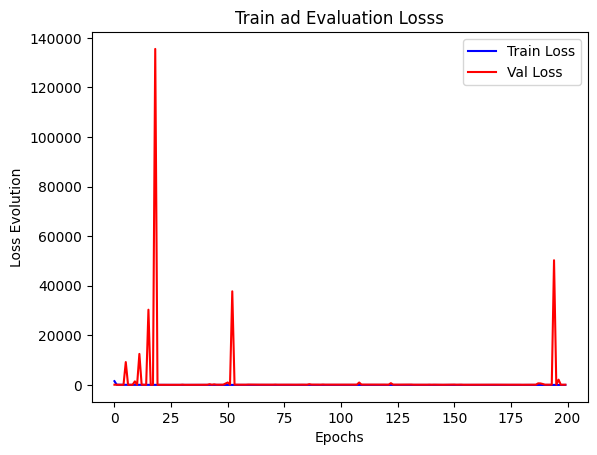

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(38.2309, device='cuda:0')
RMSE: tensor(6.1831, device='cuda:0')
MAE: tensor(4.6041, device='cuda:0')
Spearman Corr: tensor(0.6826, device='cuda:0')


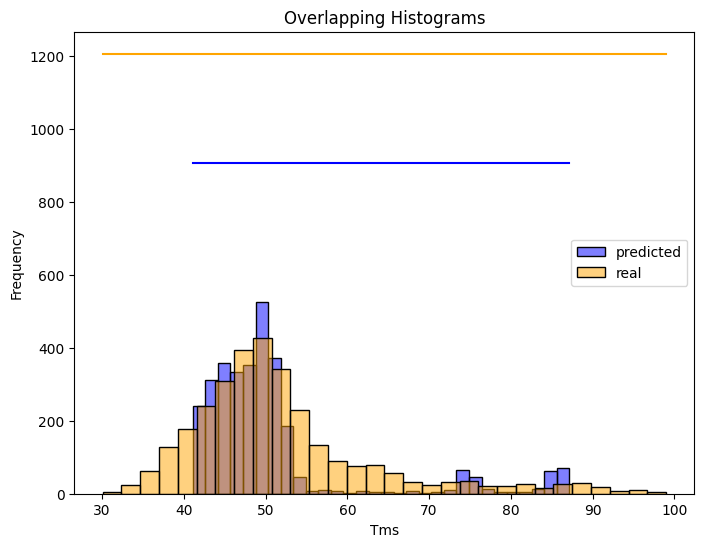

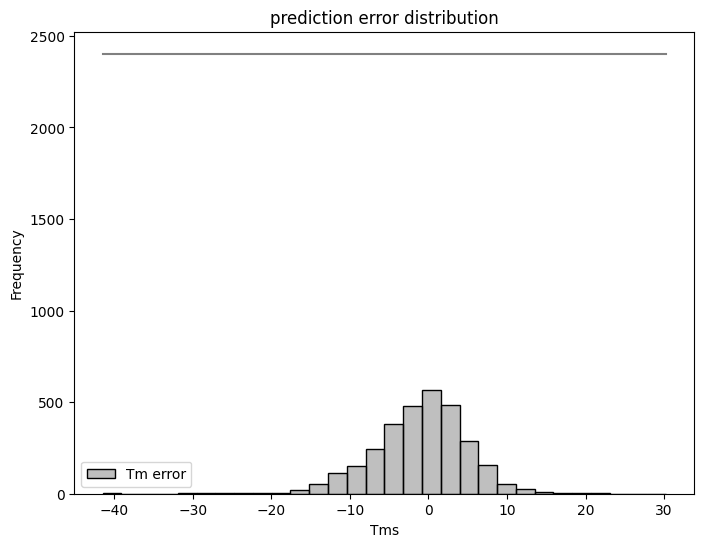

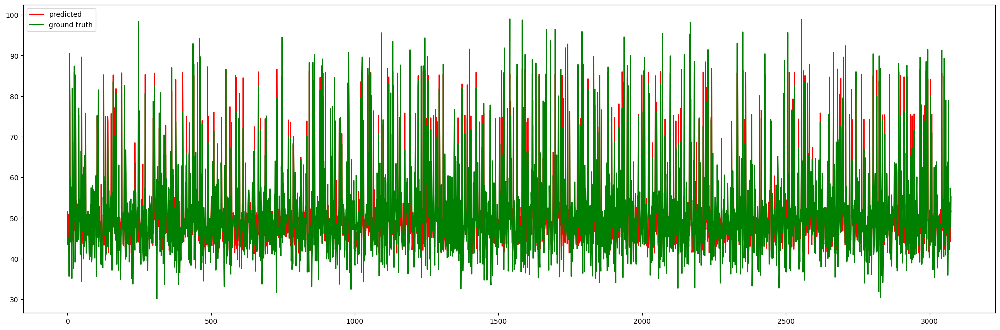

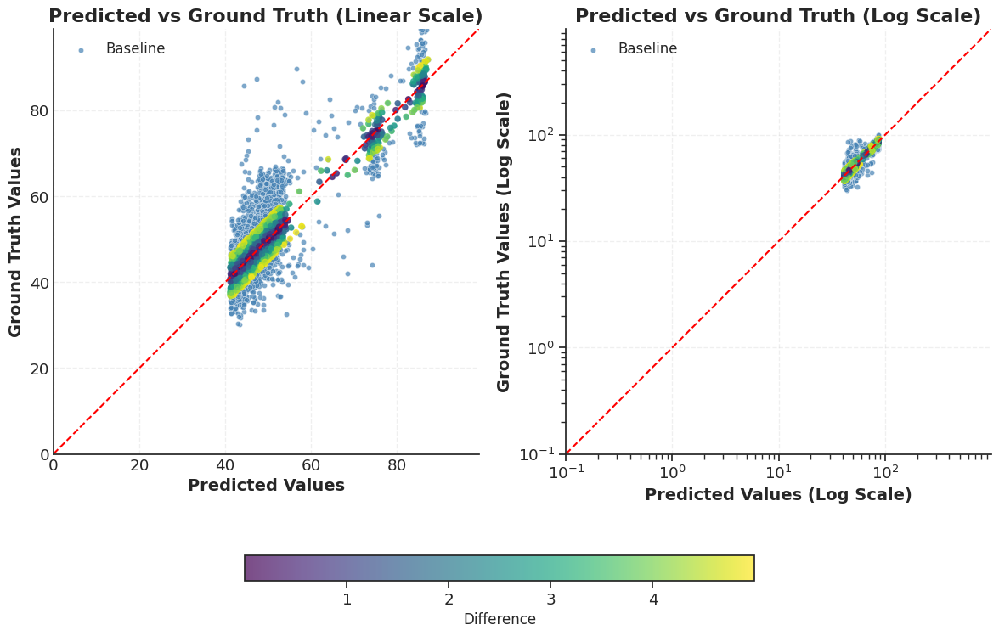

In [13]:

seq_struct_pred_W = LA_MLP_pred(embeddings_dim=1280, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)

optESM = torch.optim.AdamW(seq_struct_pred_W.parameters(), lr=1e-3)
lossESM= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

#import ipdb; ipdb.set_trace()
generating_results_approaches(seq_struct_pred_W, Trainer3, train_embedding_esm2, val_embedding_esm2, 
                              test_embedding_esm2, lossESM, optESM, epochs, device,
                              path_progres=path_progresESM, 
                              checkpoint_path=checkpoint_pathESM,
                              output_metrics=config['initial_paths']['output_metrics_ESM_only'])



### For Inverse Folding PiFold Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

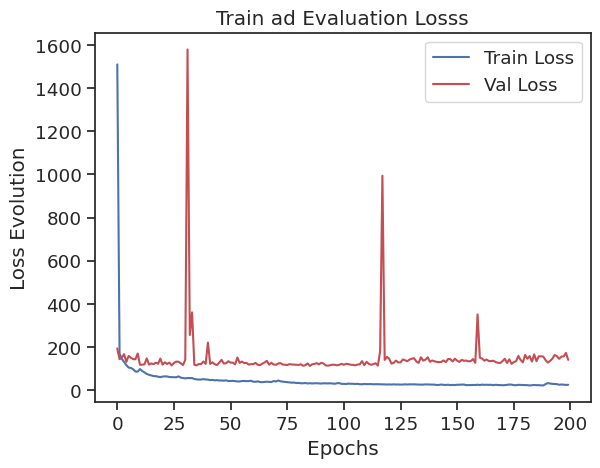

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(88.1905, device='cuda:0')
RMSE: tensor(9.3910, device='cuda:0')
MAE: tensor(6.6669, device='cuda:0')
Spearman Corr: tensor(0.3747, device='cuda:0')


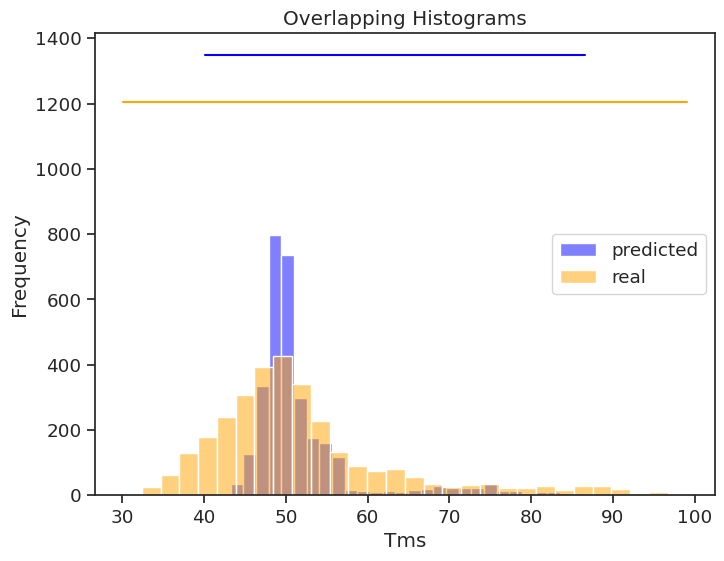

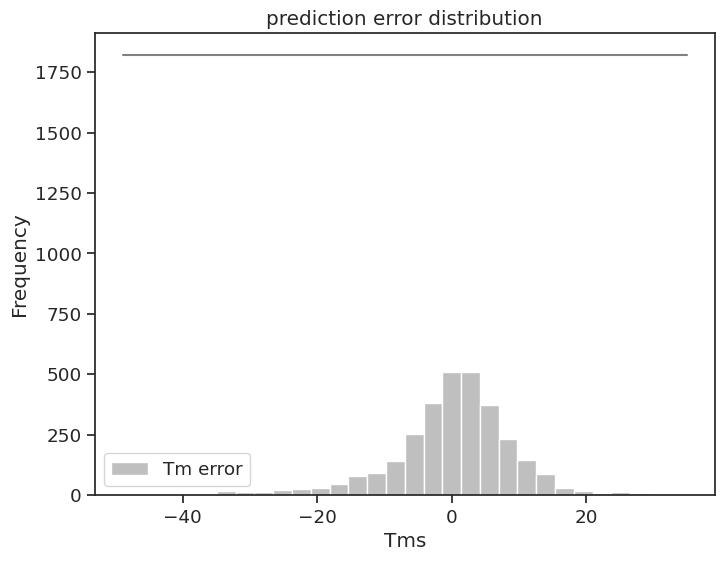

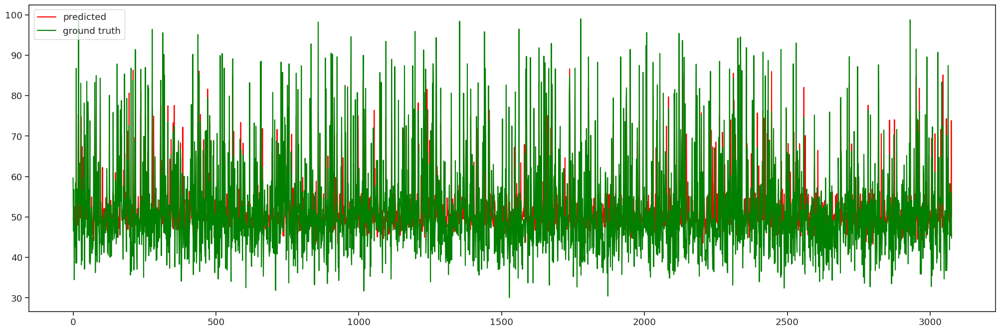

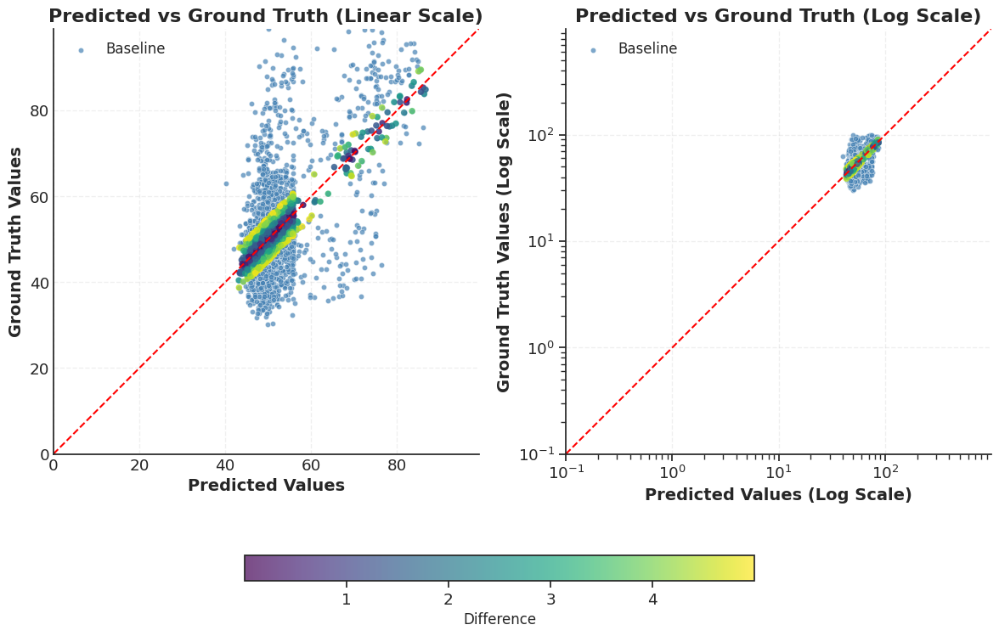

In [14]:

seq_struct_pred_W_PiFold = LA_MLP_pred(embeddings_dim=128, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optPiFold = torch.optim.AdamW(seq_struct_pred_W_PiFold.parameters(), lr=1e-3)
lossPiFold= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

generating_results_approaches(seq_struct_pred_W_PiFold, Trainer3, train_embedding_PiFold, val_embedding_PiFold, 
                              test_embedding_PiFold, lossPiFold, optPiFold, epochs, device,
                              path_progres=path_progresPiFold, 
                              checkpoint_path=checkpoint_pathPiFold,
                              output_metrics=config['initial_paths']['output_metrics_PiFold_only'])


### For Both ESM2 and Inverse Folding PiFold Contributions Together Using Prediction by Component (convolutions as a way of pooling + sum pooling to get the final predictions)

Directory '../checkpoints/Mix/Global/AllMeltome_cleaned_globalAvgtm_speedup/' created


  0%|          | 0/200 [00:00<?, ?it/s]

training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 1 loss: 1512.291 val loss: 81.197


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 2 loss: 87.774 val loss: 82.264


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 3 loss: 67.749 val loss: 73.436


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 4 loss: 51.790 val loss: 56.763


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 5 loss: 43.650 val loss: 53.906


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 6 loss: 39.745 val loss: 55.535


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 7 loss: 37.246 val loss: 52.631


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 8 loss: 33.824 val loss: 51.815


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 9 loss: 31.378 val loss: 48.927


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 10 loss: 28.113 val loss: 48.627


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 11 loss: 26.743 val loss: 52.742


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 12 loss: 25.414 val loss: 54.360


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 13 loss: 23.777 val loss: 53.883


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 14 loss: 22.825 val loss: 56.504


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 15 loss: 22.676 val loss: 61.985


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 16 loss: 21.719 val loss: 50.510


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 17 loss: 22.170 val loss: 57.926


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 18 loss: 20.687 val loss: 53.002


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 19 loss: 20.955 val loss: 49.190


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 20 loss: 19.599 val loss: 61.984


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 21 loss: 18.955 val loss: 52.892


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 22 loss: 19.450 val loss: 48.753


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 23 loss: 19.449 val loss: 59.129


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 24 loss: 19.624 val loss: 55.955


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 25 loss: 24.043 val loss: 57.871


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 26 loss: 20.989 val loss: 50.967


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 27 loss: 18.639 val loss: 59.330


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 28 loss: 18.472 val loss: 48.390


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 29 loss: 17.215 val loss: 50.366


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 30 loss: 17.252 val loss: 47.036


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 31 loss: 15.787 val loss: 54.718


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 32 loss: 16.363 val loss: 49.326


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 33 loss: 15.297 val loss: 48.596


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 34 loss: 16.262 val loss: 47.831


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 35 loss: 14.886 val loss: 50.371


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 36 loss: 15.010 val loss: 54.967


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 37 loss: 16.536 val loss: 52.184


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 38 loss: 16.304 val loss: 52.445


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 39 loss: 15.641 val loss: 55.265


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 40 loss: 14.937 val loss: 53.382


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 41 loss: 13.611 val loss: 47.922


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 42 loss: 13.749 val loss: 56.623


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 43 loss: 13.905 val loss: 48.346


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 44 loss: 13.374 val loss: 58.520


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 45 loss: 13.553 val loss: 50.880


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 46 loss: 13.074 val loss: 48.619


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 47 loss: 13.996 val loss: 54.030


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 48 loss: 12.784 val loss: 50.516


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 49 loss: 13.180 val loss: 54.237


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 50 loss: 13.184 val loss: 48.341


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 51 loss: 13.163 val loss: 50.771


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 52 loss: 12.033 val loss: 48.910


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 53 loss: 13.145 val loss: 62.839


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 54 loss: 12.085 val loss: 48.950


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 55 loss: 12.409 val loss: 51.542


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 56 loss: 11.740 val loss: 50.577


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 57 loss: 12.364 val loss: 49.656


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 58 loss: 12.769 val loss: 53.791


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 59 loss: 12.896 val loss: 48.742


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 60 loss: 11.780 val loss: 50.735


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 61 loss: 12.007 val loss: 55.877


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 62 loss: 12.029 val loss: 49.727


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 63 loss: 10.888 val loss: 49.349


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 64 loss: 11.695 val loss: 48.031


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 65 loss: 11.122 val loss: 57.279


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 66 loss: 11.540 val loss: 51.970


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 67 loss: 10.710 val loss: 50.291


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 68 loss: 10.825 val loss: 51.121


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 69 loss: 11.124 val loss: 54.891


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 70 loss: 10.994 val loss: 56.425


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 71 loss: 10.980 val loss: 52.554


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 72 loss: 10.567 val loss: 52.170


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 73 loss: 11.324 val loss: 64.042


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 74 loss: 10.570 val loss: 55.264


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 75 loss: 10.444 val loss: 57.155


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 76 loss: 10.068 val loss: 50.007


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 77 loss: 10.647 val loss: 53.988


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 78 loss: 9.509 val loss: 52.196


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 79 loss: 9.629 val loss: 47.390


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 80 loss: 10.277 val loss: 49.153


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 81 loss: 10.134 val loss: 51.554


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 82 loss: 9.859 val loss: 59.787


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 83 loss: 10.100 val loss: 54.023


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 84 loss: 10.303 val loss: 48.746


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 85 loss: 10.120 val loss: 58.430


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 86 loss: 9.756 val loss: 46.972


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 87 loss: 10.063 val loss: 55.760


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 88 loss: 9.805 val loss: 62.250


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 89 loss: 10.867 val loss: 53.260


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 90 loss: 10.196 val loss: 50.837


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 91 loss: 8.914 val loss: 51.401


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 92 loss: 9.350 val loss: 51.670


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 93 loss: 8.994 val loss: 50.509


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 94 loss: 8.676 val loss: 50.508


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 95 loss: 9.076 val loss: 49.835


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 96 loss: 9.097 val loss: 51.428


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 97 loss: 9.052 val loss: 53.313


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 98 loss: 8.449 val loss: 52.102


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 99 loss: 9.354 val loss: 50.343


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 100 loss: 8.637 val loss: 50.058


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 101 loss: 8.929 val loss: 52.229


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 102 loss: 9.048 val loss: 51.780


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 103 loss: 8.608 val loss: 55.882


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 104 loss: 9.427 val loss: 50.134


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 105 loss: 9.956 val loss: 49.860


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 106 loss: 8.672 val loss: 50.238


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 107 loss: 8.788 val loss: 55.698


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 108 loss: 8.884 val loss: 54.886


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 109 loss: 8.605 val loss: 49.242


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 110 loss: 8.814 val loss: 51.639


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 111 loss: 9.049 val loss: 50.688


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 112 loss: 8.322 val loss: 54.195


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 113 loss: 7.946 val loss: 52.123


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 114 loss: 8.908 val loss: 46.836


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 115 loss: 7.878 val loss: 50.708


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 116 loss: 8.532 val loss: 51.120


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 117 loss: 8.315 val loss: 51.213


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 118 loss: 9.199 val loss: 52.633


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 119 loss: 8.390 val loss: 50.594


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 120 loss: 7.560 val loss: 55.877


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 121 loss: 8.128 val loss: 55.057


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 122 loss: 8.132 val loss: 51.300


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 123 loss: 8.412 val loss: 55.179


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 124 loss: 7.950 val loss: 48.620


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 125 loss: 7.972 val loss: 52.893


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 126 loss: 8.387 val loss: 50.691


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 127 loss: 7.944 val loss: 52.448


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 128 loss: 8.625 val loss: 53.961


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 129 loss: 7.773 val loss: 50.276


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 130 loss: 7.556 val loss: 54.108


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 131 loss: 7.418 val loss: 49.603


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 132 loss: 7.502 val loss: 48.882


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 133 loss: 7.792 val loss: 53.048


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 134 loss: 7.356 val loss: 50.262


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 135 loss: 7.863 val loss: 52.229


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 136 loss: 7.539 val loss: 49.401


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 137 loss: 7.720 val loss: 51.052


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 138 loss: 7.865 val loss: 54.406


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 139 loss: 7.587 val loss: 50.248


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 140 loss: 8.064 val loss: 49.643


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 141 loss: 7.490 val loss: 52.942


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 142 loss: 7.517 val loss: 53.149


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 143 loss: 7.428 val loss: 48.457


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 144 loss: 7.410 val loss: 57.700


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 145 loss: 7.227 val loss: 50.107


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 146 loss: 7.574 val loss: 52.377


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 147 loss: 6.927 val loss: 51.042


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 148 loss: 7.273 val loss: 55.388


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 149 loss: 7.239 val loss: 51.227


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 150 loss: 7.247 val loss: 50.073


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 151 loss: 7.448 val loss: 50.805


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 152 loss: 7.258 val loss: 52.996


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 153 loss: 6.987 val loss: 51.378


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 154 loss: 7.459 val loss: 51.098


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 155 loss: 7.770 val loss: 54.321


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 156 loss: 6.925 val loss: 50.593


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 157 loss: 6.938 val loss: 48.937


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 158 loss: 7.090 val loss: 50.619


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 159 loss: 7.172 val loss: 47.262


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 160 loss: 6.992 val loss: 47.843


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 161 loss: 7.063 val loss: 53.158


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 162 loss: 7.144 val loss: 48.772


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 163 loss: 7.153 val loss: 54.207


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 164 loss: 7.841 val loss: 54.710


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 165 loss: 7.543 val loss: 61.182


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 166 loss: 7.151 val loss: 53.742


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 167 loss: 7.735 val loss: 49.165


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 168 loss: 7.170 val loss: 52.374


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 169 loss: 8.026 val loss: 53.566


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 170 loss: 7.239 val loss: 53.227


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 171 loss: 7.271 val loss: 54.530


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 172 loss: 7.609 val loss: 52.918


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 173 loss: 7.183 val loss: 57.663


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 174 loss: 8.062 val loss: 50.775


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 175 loss: 6.795 val loss: 51.322


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 176 loss: 7.055 val loss: 55.026


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 177 loss: 6.892 val loss: 52.024


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 178 loss: 6.462 val loss: 54.025


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 179 loss: 6.676 val loss: 50.359


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 180 loss: 6.197 val loss: 52.249


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 181 loss: 6.622 val loss: 50.007


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 182 loss: 6.516 val loss: 50.358


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 183 loss: 7.018 val loss: 52.101


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 184 loss: 7.072 val loss: 52.813


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 185 loss: 7.403 val loss: 49.914


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 186 loss: 6.899 val loss: 53.189


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 187 loss: 6.702 val loss: 50.841


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 188 loss: 6.898 val loss: 57.028


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 189 loss: 7.002 val loss: 52.579


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 190 loss: 7.359 val loss: 55.199


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 191 loss: 6.464 val loss: 51.826


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 192 loss: 6.792 val loss: 50.458


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 193 loss: 6.536 val loss: 54.102


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 194 loss: 7.087 val loss: 54.502


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 195 loss: 6.844 val loss: 55.450


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 196 loss: 6.715 val loss: 51.989


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 197 loss: 7.266 val loss: 53.064


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 198 loss: 6.980 val loss: 53.597


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 199 loss: 6.734 val loss: 52.080


training epoch by batches:   0%|          | 0/136 [00:00<?, ?it/s]

epoch: 200 loss: 6.966 val loss: 52.170


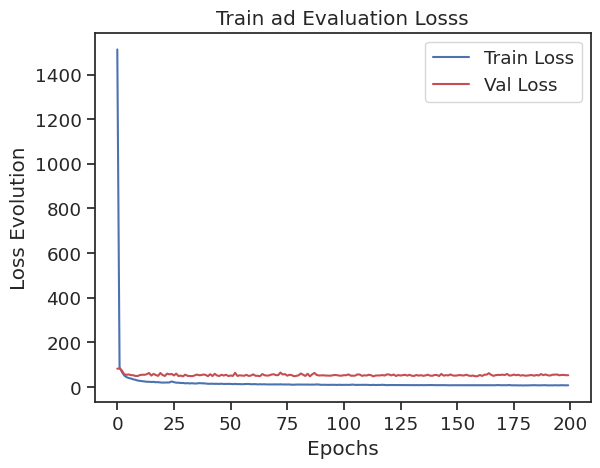

testing data:   0%|          | 0/21 [00:00<?, ?it/s]

MSE: tensor(38.4280, device='cuda:0')
RMSE: tensor(6.1990, device='cuda:0')
MAE: tensor(4.5843, device='cuda:0')
Spearman Corr: tensor(0.6945, device='cuda:0')


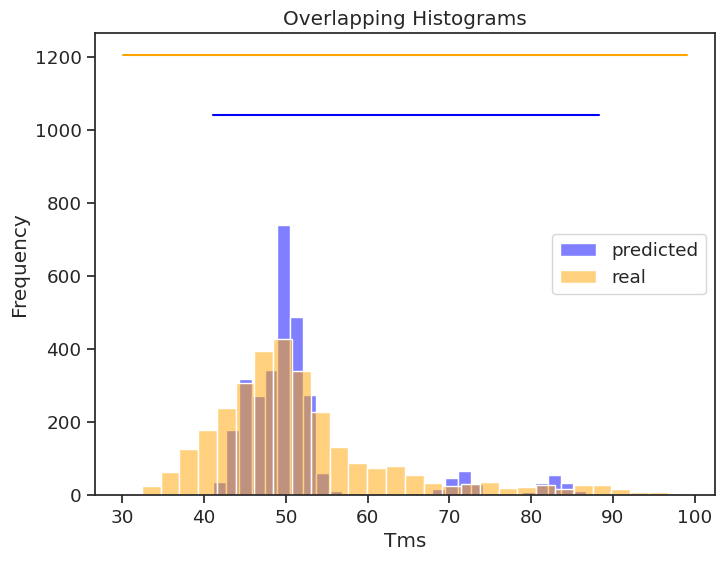

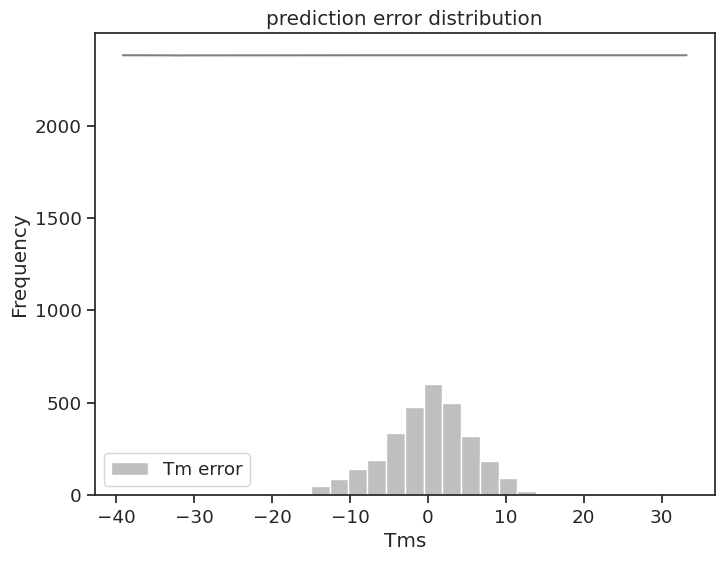

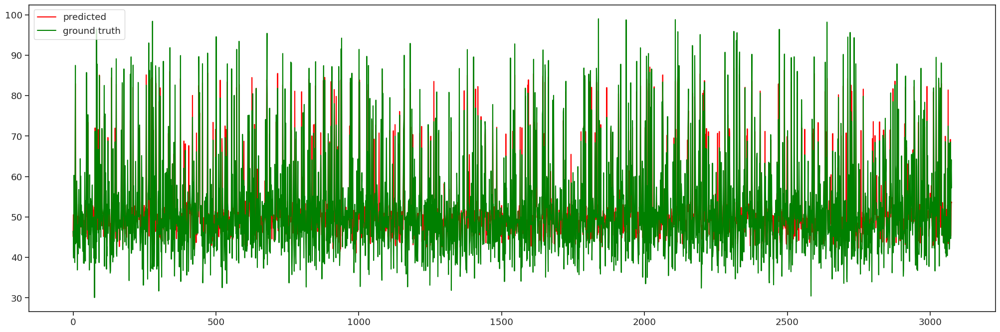

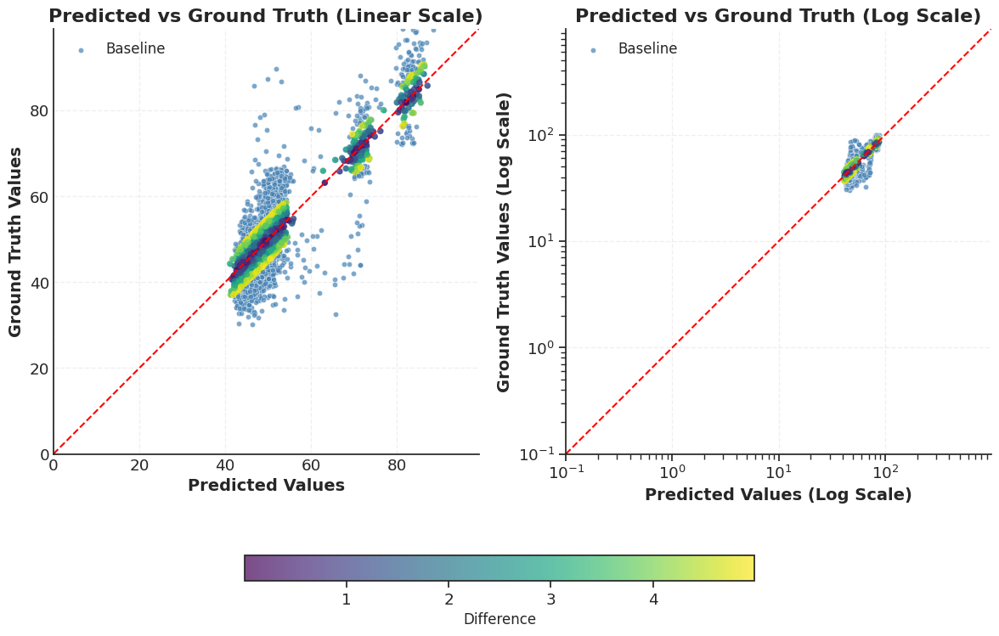

In [15]:

import torchsort, sys
sys.path.append(os.path.abspath("../ref_models/fast_soft_sort"))
from ref_models.fast_soft_sort.fast_soft_sort.pytorch_ops import soft_rank, soft_sort

#import ipdb; ipdb.set_trace()
seq_struct_pred_W_merged = LA_MLP_pred(embeddings_dim=1280+128, 
                                             output_dim=2, 
                                             dropout=0.25, 
                                             kernel_size=9, 
                                             conv_dropout= 0.25)
                                             #path_pretrained='../checkpoints/LA_MLP_TaskVectorBias_Merged_allnet_1_10_2023/')
# LightAttention(embeddings_dim=1280+128, output_dim=2, dropout=0.1, kernel_size=5, conv_dropout= 0.1)


optIFM = torch.optim.AdamW(seq_struct_pred_W_merged.parameters(), lr=1e-3)
lossIFM= BiasOrganismLoss(device)#torch.nn.MSELoss()
epochs = 200

#import ipdb; ipdb.set_trace()
generating_results_approaches(seq_struct_pred_W_merged, Trainer3, train_embedding_merged, val_embedding_merged, 
                              test_embedding_merged, lossIFM, optIFM, epochs, device,
                              path_progres=path_progresMix, 
                              checkpoint_path=checkpoint_pathMix,
                              output_metrics=config['initial_paths']['output_metrics_Both'])
